# NWA suntans: time series

In [1]:
import os

import numpy as np
import pandas as pd
import xarray as xr

%matplotlib inline
from matplotlib import pyplot as plt
dcolors = plt.rcParams['axes.prop_cycle'].by_key()['color']

from xhistogram.xarray import histogram

import pynsitu as pin
crs = pin.maps.crs

import nwatools as nwa

ERROR 1: PROJ: proj_create_from_database: Open of /home1/datahome/aponte/.miniconda3/envs/equinox/share/proj failed


In [2]:
if False:
    from dask.distributed import Client, LocalCluster
    from dask_jobqueue import PBSCluster
    cluster = PBSCluster()
    #cluster = PBSCluster(cores=28, processes=14)
    #cluster = PBSCluster(cores=14, processes=7)
    w = cluster.scale(jobs=10)
    #
    client = Client(cluster)
    client
else:
    from dask.distributed import Client, LocalCluster
    #
    cluster = LocalCluster()
    client = Client(cluster)
    client

---
## load data

In [37]:
def load_data(lon, lat):
    
    ds, grd = nwa.load_surf()
    idx = nwa.find_point_index(lon, lat, grd)
    ds = ds.isel(Nk=0).sel(Nc=idx).drop(["xp", "yp", "lonp", "latp",])
    #
    grd = grd.isel(Nk=0).sel(Nc=idx).drop(["xp", "yp",])    
    ds = ds.assign_coords(**grd)
    f = pin.geo.coriolis(ds.yv)

    zarr = os.path.join(nwa.suntans_dir, f"suntans_2km_surf_low")
    ds_low = xr.open_zarr(zarr)
    ds_low = ds_low.isel(Nk=0).sel(Nc=idx) #.drop(["xp", "yp", "lonp", "latp",])
    ds_low = ds_low.assign_coords(**grd)

    zarr = os.path.join(nwa.suntans_dir, "suntans_2km_surf_gradients")
    _ds = xr.open_zarr(zarr).sel(Nc=idx)
    ds["vorticity"] = (_ds["dvcdx"] - _ds["ducdy"])/f

    zarr = os.path.join(nwa.suntans_dir, f"suntans_2km_surf_low_gradients")
    _ds_low = xr.open_zarr(zarr).sel(Nc=idx)
    ds_low["vorticity"] = (_ds_low["dvcdx"] - _ds_low["ducdy"])/f

    #Ac = nwa.get_Ac()
    
    return ds.compute(), ds_low.compute()

### point 1

In [38]:
lon, lat = 122, -14.9
ds, ds_low = load_data(lon, lat)

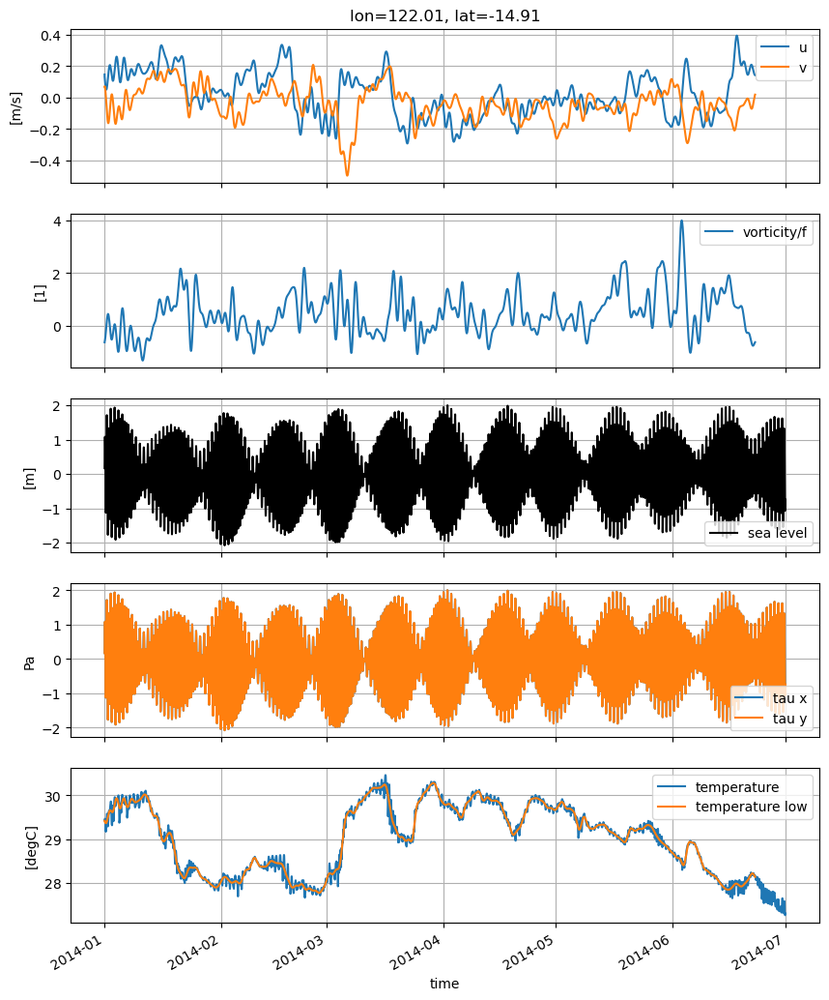

In [72]:

def plot_tseries(ds, ds_low, tslice=None):

    if tslice is not None:
        ds = ds.sel(time=tslice)
        ds_low = ds_low.sel(time=tslice)

    fig, axes = plt.subplots(5,1,figsize=(10,12), sharex=True,)

    # velocity
    ax = axes[0]
    ds_low.uc.plot(ax=ax, label="u")
    ds_low.vc.plot(ax=ax, label="v")
    ax.set_title(f"lon={float(ds.lonv):.2f}, lat={float(ds.latv):.2f}")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")
    ax.set_ylabel("[m/s]")

    # vorticity
    ax = axes[1]
    ds_low.vorticity.plot(ax=ax, label="vorticity/f")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")
    ax.set_ylabel("[1]")
    ax.set_title("")
    
    # sea level
    ax = axes[2]
    ds.eta.plot(ax=ax, color="k", label="sea level")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")
    ax.set_ylabel("[m]")
    ax.set_title("")

    # wind
    ax = axes[3]
    ds.tau_x.plot(ax=ax, label="tau x")
    ds.tau_y.plot(ax=ax, label="tau y")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")
    ax.set_ylabel("Pa")
    ax.set_title("")

    # temperature
    ax = axes[4]
    ds.temp.plot(ax=ax, label="temperature")
    ds_low.temp.plot(ax=ax, label="temperature low")
    ax.legend()
    ax.grid()
    ax.set_ylabel("[degC]")
    ax.set_title("")
    
    
tslice = slice("2014/01/01", None)
plot_tseries(ds, ds_low, tslice=tslice)

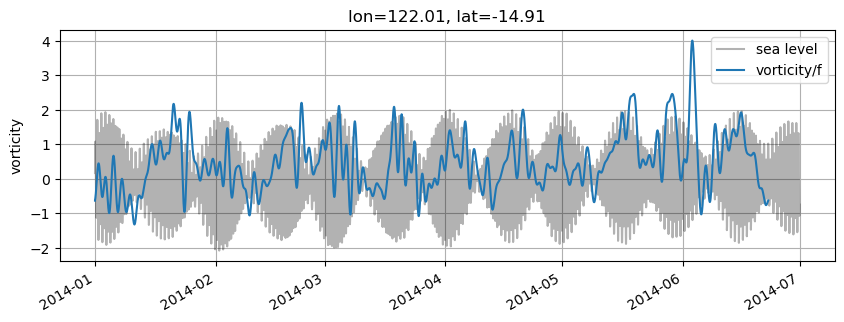

In [68]:
def plot_vorticity_sealevel(ds, ds_low, tslice=tslice):
    if tslice is not None:
        ds = ds.sel(time=tslice)
        ds_low = ds_low.sel(time=tslice)

    fig, ax = plt.subplots(1,1,figsize=(10,3))

    # vorticity
    ds.eta.plot(ax=ax, color="k", label="sea level", alpha=0.3)
    ds_low.vorticity.plot(ax=ax, label="vorticity/f")
    ax.set_title(f"lon={float(ds.lonv):.2f}, lat={float(ds.latv):.2f}")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")
    
plot_vorticity_sealevel(ds, ds_low, tslice=tslice)

---
## along transects

In [16]:
_, grd = nwa.load_surf()

def load_surf(t):
    
    ds, grd = nwa.load_surf()
    ds = ds.isel(Nk=0).sel(time=t).drop(["xp", "yp", "lonp", "latp",])
    #
    grd = grd.isel(Nk=0).drop(["xp", "yp",])    
    ds = ds.assign_coords(**grd)
    f = pin.geo.coriolis(ds.yv)

    zarr = os.path.join(nwa.suntans_dir, f"suntans_2km_surf_low")
    ds_low = xr.open_zarr(zarr)
    ds_low = ds_low.isel(Nk=0).sel(time=t) #.drop(["xp", "yp", "lonp", "latp",])
    ds_low = ds_low.assign_coords(**grd)
    
    zarr = os.path.join(nwa.suntans_dir, "suntans_2km_surf_gradients")
    _ds = xr.open_zarr(zarr).sel(time=t)
    ds["vorticity"] = (_ds["dvcdx"] - _ds["ducdy"])/f

    zarr = os.path.join(nwa.suntans_dir, f"suntans_2km_surf_low_gradients")
    _ds_low = xr.open_zarr(zarr).sel(time=t)
    ds_low["vorticity"] = (_ds_low["dvcdx"] - _ds_low["ducdy"])/f
    
    return ds.compute(), ds_low.compute()

def load_transect(i):
    ds = xr.open_zarr(os.path.join(nwa.suntans_dir, f"T{i}.zarr"))
    ds_low = xr.open_zarr(os.path.join(nwa.suntans_dir, f"T{i}_low.zarr"))
    return ds, ds_low

In [17]:
t = "2014/02/21 00:00"

surf, surf_low = load_surf(t)

In [10]:
T = {i: load_transect(i) for i in range(3)}

Changing the _FillValue from -999999 to 999999


/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


Text(0.5, 1.0, 'relative vorticity')

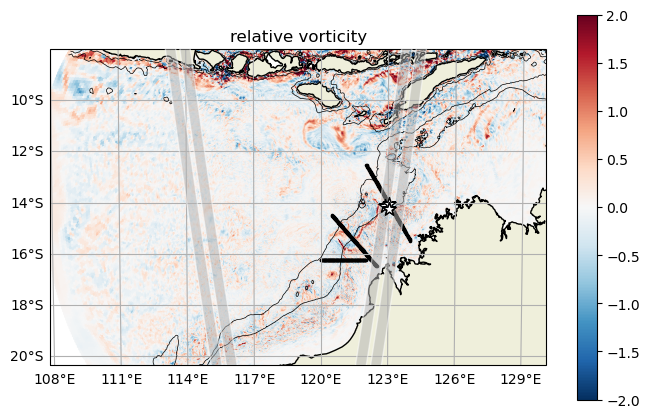

In [18]:
da = surf_low["vorticity"]

zoom="cp_large"
zoom="large"

fig, ax = nwa.map_init(zoom, bathy=(grd, surf))
nwa.plot_moorings(ax)
_, _, poly, cbar = grd.suntans.plotcelldata(da, vmin=-2., vmax=2., cmap='RdBu_r', crs=crs)

for i, tr in T.items():
    ax.scatter(tr[0].lon.values, tr[0].lat.values, s=10, c="k", marker=".", transform=crs)

ax.set_title(f"relative vorticity")

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


Text(0.5, 1.0, 'relative vorticity')

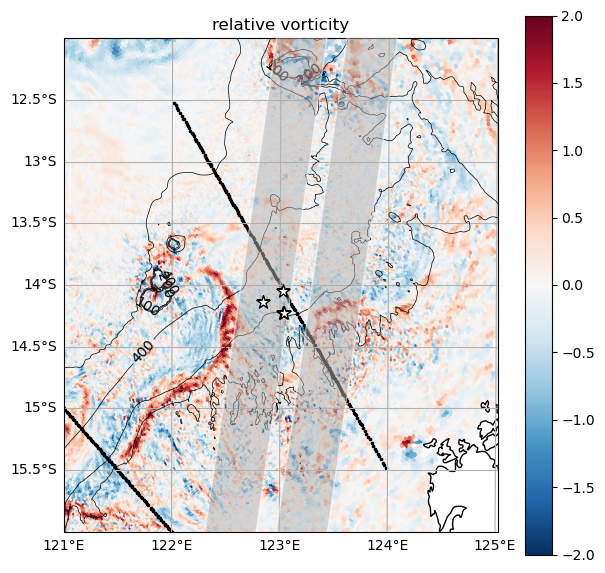

In [99]:
zoom="cp_large"

fig, ax = nwa.map_init(zoom, bathy=(grd, surf))
nwa.plot_moorings(ax)
_, _, poly, cbar = grd.suntans.plotcelldata(da, vmin=-2., vmax=2., cmap='RdBu_r', crs=crs)

for i, tr in T.items():
    ax.scatter(tr[0].lon.values, tr[0].lat.values, s=10, c="k", marker=".", transform=crs)

ax.set_title(f"relative vorticity")

---
## transects at a single time

In [37]:
def plot_transect(i, t, depth_max = 400):

    ds = T[i][1].sel(time=t).compute() # 0 instantaneous, 1 low frequency
    ds = ds.where(ds.z_r<depth_max, drop=True)

    fig, axes = plt.subplots(3,1, figsize=(10,8), sharex=True, sharey=True)

    ax = axes[0]
    ds.uc.plot(ax=ax, x="lon", y="z_r")
    ax.grid()
    ax.set_ylabel("depth [m]")
    ax.set_xlabel("")
    ax.set_title(t)

    ax = axes[1]
    ds.vc.plot(ax=ax, x="lon", y="z_r")
    ax.grid()
    ax.set_ylabel("depth [m]")
    ax.set_xlabel("")
    ax.set_title("")

    ax = axes[2]
    ds.temp.plot.contourf(ax=ax, x="lon", y="z_r", levels=30)
    ax.set_ylabel("depth [m]")
    ax.grid()
    ax.set_title("")

    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()


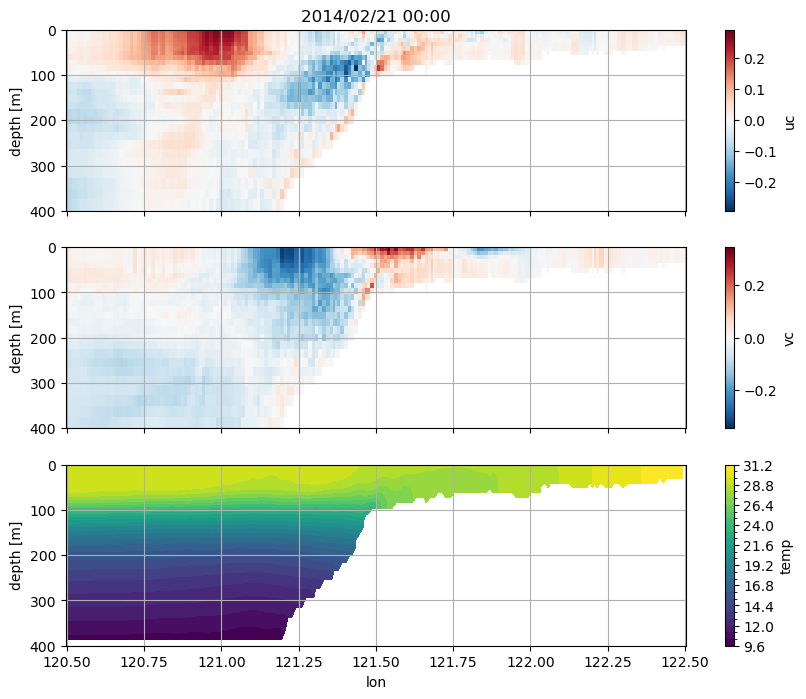

In [38]:
plot_transect(1, t, depth_max = 400)

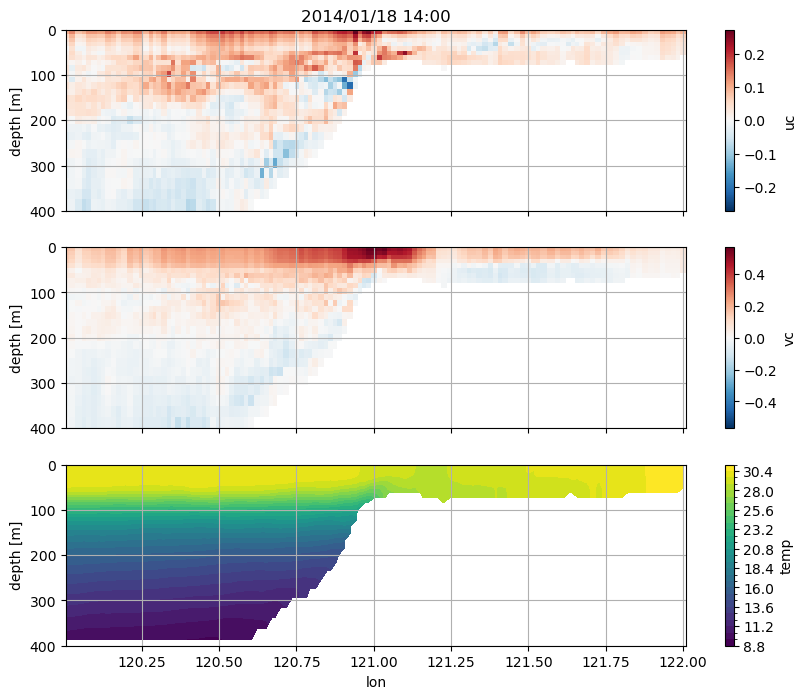

In [40]:
plot_transect(0, "2014/01/18 14:00", depth_max = 400)

---
## station along a transect

In [92]:
def plot_transection_station(itr, idx, depth_max = 400, tslice=None, add_colorbar=True):

    ds, ds_low = T[itr]
    ds = ds.isel(s=idx).drop("Nk").compute()
    ds_low = ds_low.isel(s=idx).compute()
    
    if tslice is not None:
        ds = ds.sel(time=tslice)
        ds_low = ds_low.sel(time=tslice)    

    ds = ds.where(ds.z_r<depth_max, drop=True)
    ds_low = ds_low.where(ds_low.z_r<depth_max, drop=True)

    fig, axes = plt.subplots(5,1, figsize=(10,8), sharex=True)

    ax = axes[0]
    ds_low.uc.plot(ax=ax, x="time", y="z_r", add_colorbar=add_colorbar)
    ax.grid()
    ax.set_ylabel("depth [m]")
    ax.set_xlabel("")
    ax.set_title(f"lon={float(ds.lon):.2f}, lat={float(ds.lat):.2f}")
    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()
    
    ax = axes[1]
    ds_low.vc.plot(ax=ax, x="time", y="z_r", add_colorbar=add_colorbar)
    ax.grid()
    ax.set_ylabel("depth [m]")
    ax.set_xlabel("")
    ax.set_title("")
    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()
    
    ax = axes[2]
    ds_low.temp.plot.contourf(ax=ax, x="time", y="z_r", levels=30, add_colorbar=add_colorbar)
    ax.set_ylabel("depth [m]")
    ax.grid()
    ax.set_xlabel("")
    ax.set_title("")
    ax.set_ylim(0, depth_max)
    ax.invert_yaxis()
    
    ax = axes[3]
    ds.eta.isel(Nk=0).plot(ax=ax, x="time", label="tau_x")
    ax.set_xlabel("")
    ax.set_ylabel("[m]")
    ax.grid()
    ax.set_title("")

    ax = axes[4]
    ds.tau_x.isel(Nk=0).plot(ax=ax, x="time", label="tau_x")
    ds.tau_y.isel(Nk=0).plot(ax=ax, x="time", label="tau_y")
    ax.set_xlabel("")
    ax.set_ylabel("[Pa]")
    ax.grid()
    ax.set_title("")

In [ ]:
itr = 0
lon = T[itr][0].lon.compute()
ilon = int(abs(lon-121.2).argmin())

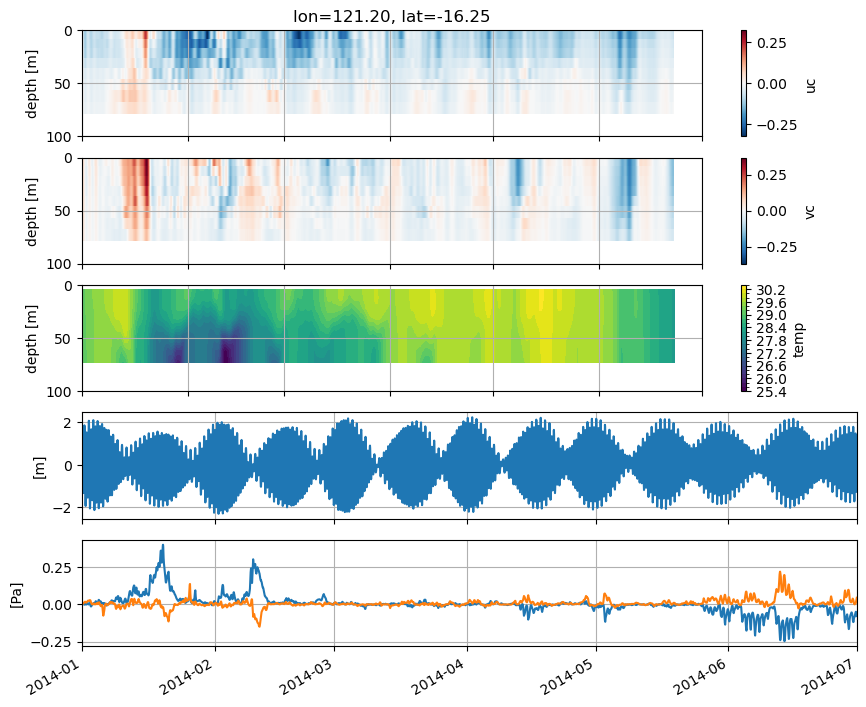

In [93]:
# just to capture colorbar ... hacky
plot_transection_station(itr, ilon, depth_max = 100, tslice=slice("2014/01/01", None), add_colorbar=True)

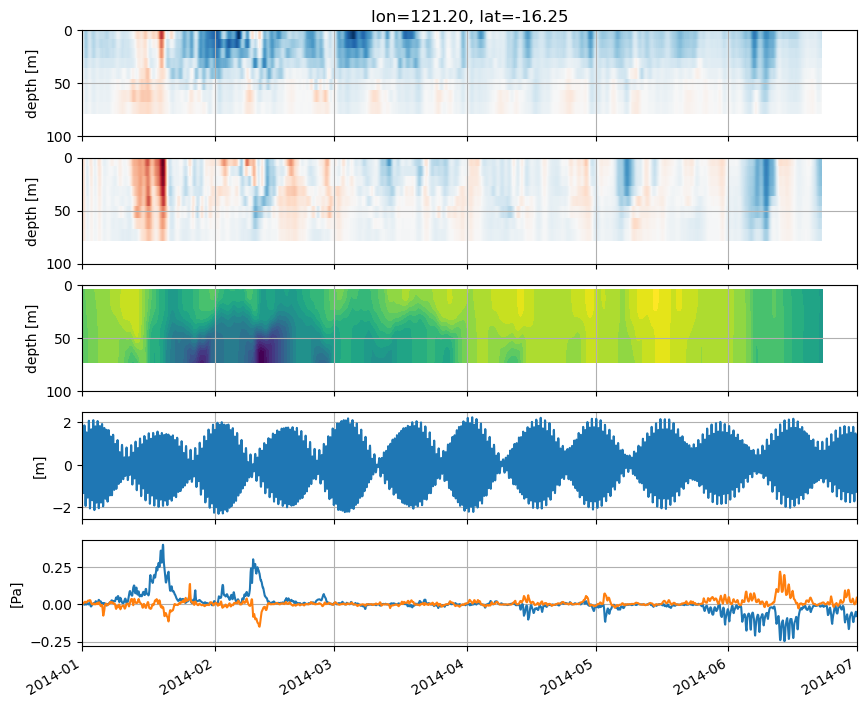

In [94]:
plot_transection_station(itr, ilon, depth_max = 100, tslice=slice("2014/01/01", None), add_colorbar=False)

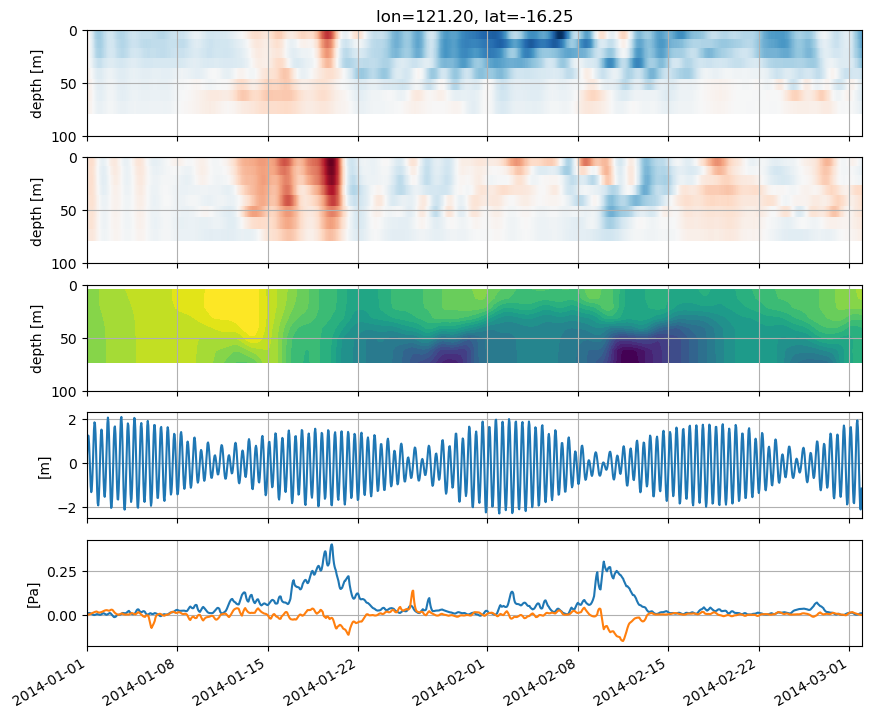

In [96]:
plot_transection_station(itr, ilon, depth_max = 100, tslice=slice("2014/01/01", "2014/03/01"), add_colorbar=False)

In [101]:
itr = 1
lon = T[itr][0].lon.compute()
ilon = int(abs(lon-121.5).argmin())
ilon

81

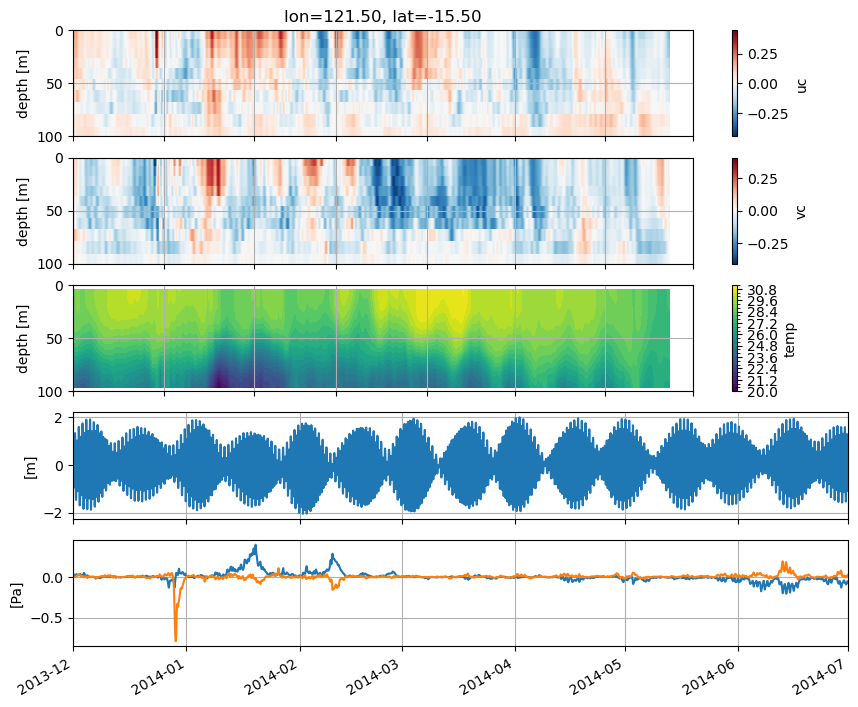

In [103]:
plot_transection_station(itr, ilon, depth_max=100, tslice=slice("2013/12/01", None), add_colorbar=True)

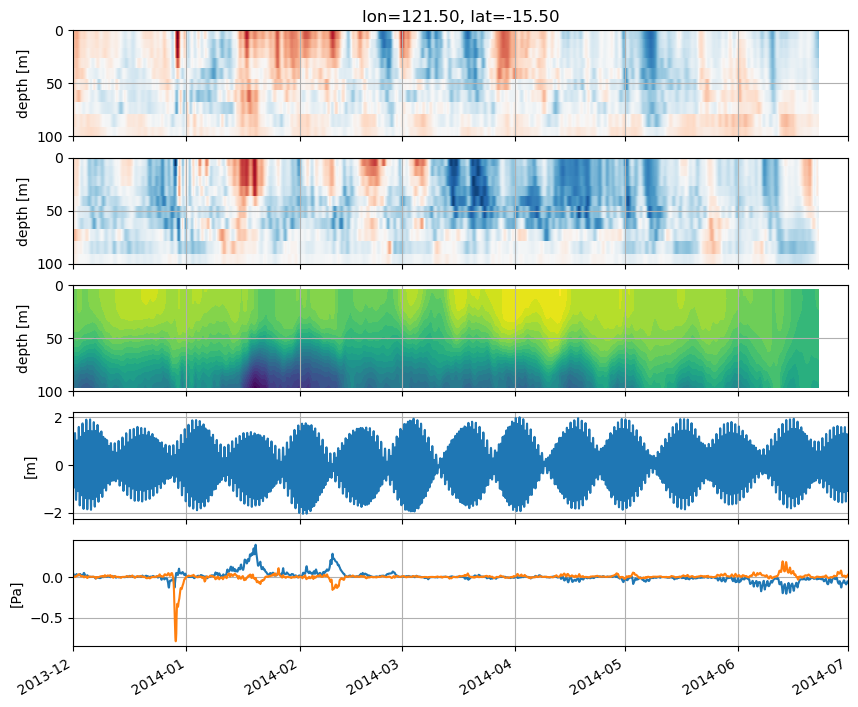

In [102]:
plot_transection_station(itr, ilon, depth_max=100, tslice=slice("2013/12/01", None), add_colorbar=False)

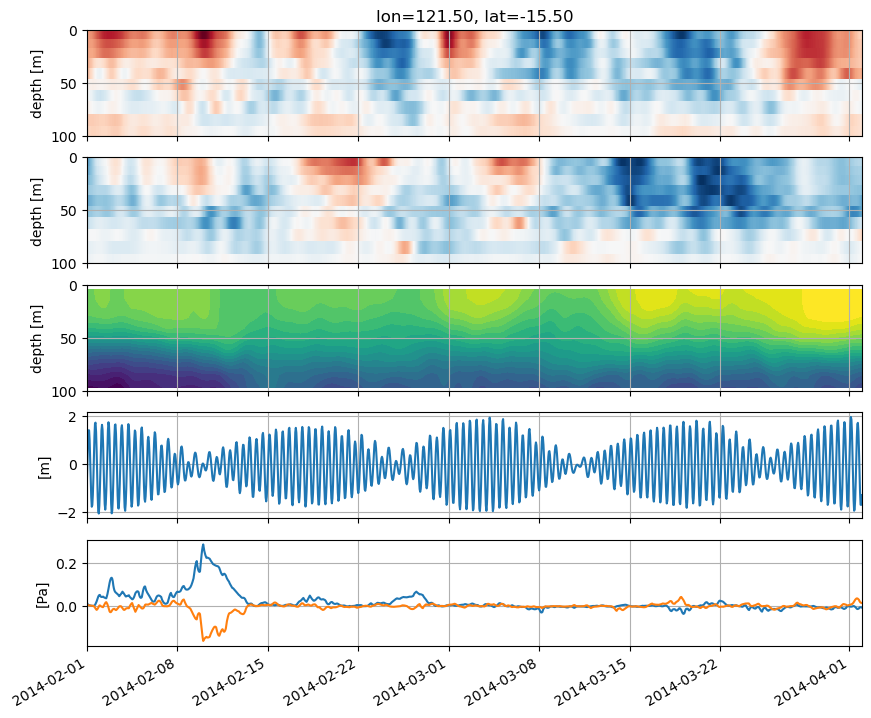

In [104]:
plot_transection_station(itr, ilon, depth_max=100, tslice=slice("2014/02/01", "2014/04/01"), add_colorbar=False)

---

In [25]:
cluster.close()